In [1]:
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import pandas as pd
import cv2
from PIL import Image
from tqdm import tqdm
import skimage.feature as feature
import numpy as np
import matplotlib.patches as patches
import os
import pickle
import json
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.datasets import register_coco_instances, load_coco_json
from detectron2.data.catalog import DatasetCatalog
from skimage import io
import random
from detectron2.data.datasets import register_coco_instances
import random
from detectron2.utils.visualizer import Visualizer

In [7]:
import torch

# Model
model = torch.hub.load('yolov5','custom', path='best.pt',force_reload=True,source='local')

# Images
img = '933.jpg'  # or file, Path, PIL, OpenCV, numpy, list

# Inference
results = model(img)

# Results
results.print()

YOLOv5 🚀 2022-8-15 Python-3.7.6 torch-1.12.1+cu102 CUDA:0 (NVIDIA GeForce GTX 1660 Ti with Max-Q Design, 5945MiB)

Fusing layers... 
Model summary: 280 layers, 12331312 parameters, 0 gradients
Adding AutoShape... 


image 1/1: 936x1404 11 adult_females
Speed: 21.9ms pre-process, 21.0ms inference, 11.7ms NMS per image at shape (1, 3, 448, 640)


In [51]:
results.pred[0]

tensor([[9.97467e+02, 4.13337e+02, 1.03010e+03, 4.45946e+02, 4.55757e-01, 1.00000e+00],
        [1.72264e+02, 2.63389e+02, 2.05205e+02, 2.96963e+02, 3.96704e-01, 1.00000e+00],
        [7.43280e+02, 6.38882e+02, 7.77289e+02, 6.72922e+02, 3.61869e-01, 1.00000e+00],
        [5.41036e+02, 7.95377e+02, 5.74740e+02, 8.29353e+02, 3.41705e-01, 1.00000e+00],
        [9.93950e+02, 5.25263e+02, 1.02783e+03, 5.59566e+02, 3.01699e-01, 1.00000e+00],
        [2.01204e+02, 2.33862e+02, 2.35515e+02, 2.68292e+02, 2.97890e-01, 1.00000e+00],
        [7.95064e+02, 7.08040e+02, 8.31158e+02, 7.44107e+02, 2.96807e-01, 1.00000e+00],
        [7.42307e+02, 5.24691e+02, 7.79464e+02, 5.60158e+02, 2.85562e-01, 1.00000e+00],
        [9.48672e+02, 8.72644e+02, 9.82383e+02, 9.07189e+02, 2.80435e-01, 1.00000e+00],
        [7.10334e+02, 5.50245e+02, 7.46548e+02, 5.85795e+02, 2.66230e-01, 1.00000e+00],
        [9.97136e+02, 3.75598e+02, 1.03093e+03, 4.09260e+02, 2.62785e-01, 1.00000e+00]], device='cuda:0')

In [42]:
import matplotlib.pyplot as plt
from PIL import Image

img=results.imgs[0]
im = Image.fromarray(img)
im.save("test.jpg")

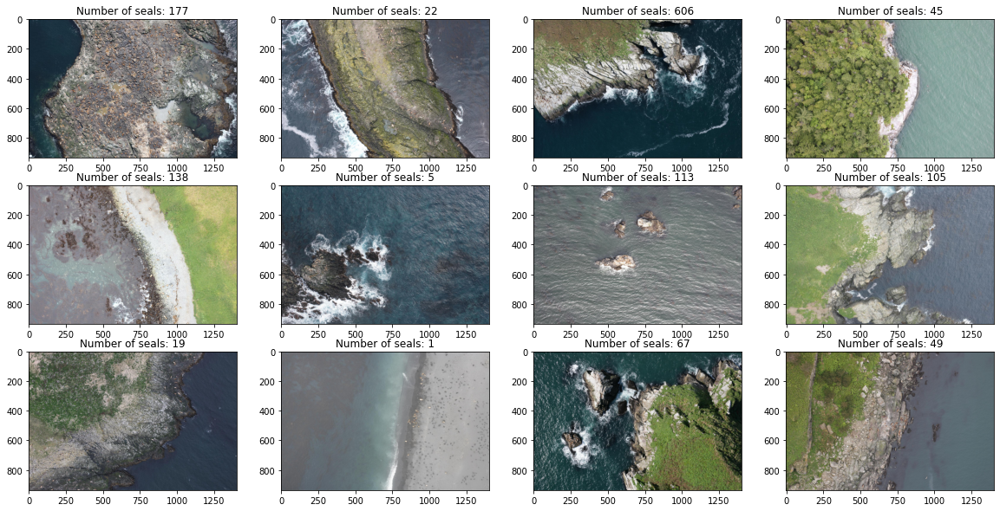

In [3]:
y_categories={
    "red": "adult males",
    "magenta": "subadult males",
    "brown": "adult females",
    "blue": "juveniles",
    "green": "pups"
}
folder="../Downsampled/Train/"
files = [os.path.join(folder, f) for f in os.listdir(folder) if (os.path.isfile(os.path.join(folder, f)) and  "csv" not in f and "json" not in f)]
files=sorted(files)
fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
data=pd.read_csv("../Downsampled/train.csv",index_col="train_id")
i=0
for file, ax in zip(files, axs):
    
    img=plt.imread(file)
    ax.title.set_text("Number of seals: " + str(data.sum(axis=1)[41+i]))
    ax.imshow(img)
    i+=1
plt.show()

In [3]:

folderdotted = "../Downsampled/TrainDotted/"
filesdotted = [os.path.join(folderdotted, f) for f in os.listdir(folderdotted) if (os.path.isfile(os.path.join(folderdotted, f)) and  "csv" not in f and "json" not in f)]
filesdotted=sorted(filesdotted)
classes = ["adult_males", "subadult_males", "adult_females", "juveniles", "pups", "other"]
# dataframe to store results in
count_df = pd.DataFrame(index=files, columns=classes).fillna(0)
blob_list=[]
folder_blobs = "../NOAA/blob_detection/"
files_blobs = [os.path.join(folder_blobs, f) for f in os.listdir(folder_blobs) if (os.path.isfile(os.path.join(folder_blobs, f)) and  "csv" not in f and "json" not in f)]
files_blobs=sorted(files_blobs)

In [4]:
import pickle

folder="../NOAA/Train/"
files = [os.path.join(folder, f) for f in os.listdir(folder) if (os.path.isfile(os.path.join(folder, f)) and  "csv" not in f and "json" not in f)]
files=sorted(files)
folderdotted = "../NOAA/TrainDotted/"
filesdotted = [os.path.join(folderdotted, f) for f in os.listdir(folderdotted) if (os.path.isfile(os.path.join(folderdotted, f)) and  "csv" not in f and "json" not in f)]
filesdotted=sorted(filesdotted)
classes = ["adult_males", "subadult_males", "adult_females", "juveniles", "pups", "other"]
# dataframe to store results in
count_df = pd.DataFrame(index=files, columns=classes).fillna(0)




blob_list=[]
with open("../NOAA/save0.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save100.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save200.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save300.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save400.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save500.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save600.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save700.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save800.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save900.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()
with open("../NOAA/save947.pkl","rb") as f:
    items=pickle.load(f)
    for item in items:
        item[1]="../NOAA/Train/"+item[1].split("/")[-1]
        blob_list.append(item)
    f.close()

blob_list2=[]
for i in tqdm(range(len(blob_list))):
     
    # read the Train and Train Dotted images
    image_1 = cv2.imread(blob_list[i][1])
    image_2 = cv2.imread("../NOAA/TrainDotted/"+blob_list[i][1].split("/")[-1])
    if image_1.shape != image_2.shape:
        image_2 = cv2.rotate(image_2, cv2.ROTATE_90_CLOCKWISE)
    
    # detect blobs
    blobs = blob_list[i][0]
    
    # prepare the image to plot the results on
    #image_7 = cv2.cvtColor(image_6, cv2.COLOR_GRAY2BGR)
    blob_type=[]
    for blob in blobs:
        # get the coordinates for each blob
        y, x, s= blob
        # get the color of the pixel from Train Dotted in the center of the blob
        b,g,r = image_2[int(y)][int(x)][:]
        # decision tree to pick the class of the blob by looking at the color in Train Dotted
        if r > 200 and b < 50 and g < 50: # RED
            count_df["adult_males"][blob_list[i][1]] += 1
            blob_type.append("adult_male")
        elif r > 200 and b > 200 and g < 50: # MAGENTA
            count_df["subadult_males"][blob_list[i][1]] += 1
            blob_type.append("subadult_male")         
        elif r < 100 and b < 100 and 150 < g < 200: # GREEN
            count_df["pups"][blob_list[i][1]] += 1
            blob_type.append("pup")
        elif r < 100 and  100 < b and g < 100: # BLUE
            count_df["juveniles"][blob_list[i][1]] += 1 
            blob_type.append("juvenile")
        elif r < 150 and b < 50 and g < 100:  # BROWN
            count_df["adult_females"][blob_list[i][1]] += 1
            blob_type.append("adult_female")         
        else:
            count_df["other"][blob_list[i][1]] += 1
            blob_type.append("other")    
    blob_list2.append([blobs,blob_type,blob_list[i][1]])    

100%|██████████| 948/948 [17:10<00:00,  1.09s/it]  


../NOAA/Train/102.jpg
../NOAA/TrainDotted/102.jpg


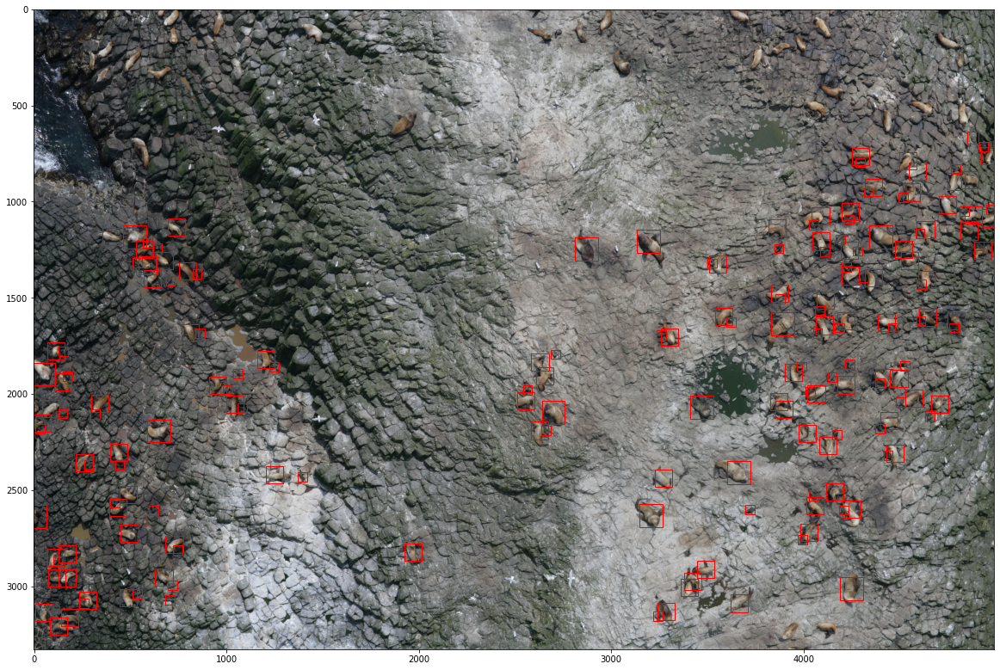

In [6]:
img_bb_list=[]
for blobs in blob_list2:
    bb_list=[]
    i=0
    for blob in blobs[0]:
        y,x,s=blob
        if blobs[1][i]=="adult_male":
            size=20
        elif blobs[1][i]=="subadult_male":
            size=15
        elif blobs[1][i]=="pup":
            size=8
        elif blobs[1][i]=="juvenile":
            size=15
        elif blobs[1][i]=="adult_female":
            size=15
        elif blobs[1][i]=="other":
            size=10 
        y_min=int(np.floor(y-(size)*s))
        y_max=int(np.floor(y+(size)*s))
        x_min=int(np.floor(x-(size)*s))
        x_max=int(np.floor(x+(size)*s))
        bb_list.append([y_min,y_max,x_min,x_max])
        i=i+1
    img_bb_list.append(bb_list)
    
j=5
print(files[j])
print(filesdotted[j])
fig,ax = plt.subplots(1,figsize=(20,20))
img=plt.imread(files[j])
ax.imshow(img)
for i in range(len(img_bb_list[j])):
    height=img_bb_list[j][i][1]-img_bb_list[j][i][0]
    width=img_bb_list[j][i][3]-img_bb_list[j][i][2]
    rect = patches.Rectangle((img_bb_list[j][i][2],img_bb_list[j][i][0]),width,height,linewidth=1,edgecolor='r',facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)
    
with open("full_resolution.pkl","wb") as f:
    pickle.dump((img_bb_list,blob_list),f)

In [79]:
for i in tqdm(range(len(files))):
    
    # read the Train and Train Dotted images
    image = cv2.imread(files_blobs[i])
    image_2 = cv2.imread(filesdotted[i])
    
    # detect blobs
    blobs = feature.blob_log(image, min_sigma=3, max_sigma=4, num_sigma=1, threshold=0.02)
    
    # prepare the image to plot the results on
    #image_7 = cv2.cvtColor(image_6, cv2.COLOR_GRAY2BGR)
    blob_type=[]
    for blob in blobs:
        # get the coordinates for each blob
        y, x, s, d= blob
        # get the color of the pixel from Train Dotted in the center of the blob
        b,g,r = image_2[int(y)][int(x)][:]
        # decision tree to pick the class of the blob by looking at the color in Train Dotted
        if r > 200 and b < 50 and g < 50: # RED
            count_df["adult_males"][files[i]] += 1
            blob_type.append("adult_male")
        elif r > 200 and b > 200 and g < 50: # MAGENTA
            count_df["subadult_males"][files[i]] += 1
            blob_type.append("subadult_male")         
        elif r < 100 and b < 100 and 150 < g < 200: # GREEN
            count_df["pups"][files[i]] += 1
            blob_type.append("pup")
        elif r < 100 and  100 < b and g < 100: # BLUE
            count_df["juveniles"][files[i]] += 1 
            blob_type.append("juvenile")
        elif r < 150 and b < 50 and g < 100:  # BROWN
            count_df["adult_females"][files[i]] += 1
            blob_type.append("adult_female")         
        else:
            count_df["other"][files[i]] += 1
            blob_type.append("other")        
    blob_list.append([blobs,blob_type,files[i]])

100%|██████████| 14/14 [00:33<00:00,  2.36s/it]


In [57]:
img_bb_list=[]
for blobs in blob_list:
    bb_list=[]
    i=0
    for blob in blobs[0]:
        y,x,s,d=blob
        if blobs[1][i]=="adult_male":
            size=15
        elif blobs[1][i]=="subadult_male":
            size=13
        elif blobs[1][i]=="pup":
            size=5
        elif blobs[1][i]=="juvenile":
            size=10
        elif blobs[1][i]=="adult_female":
            size=10
        elif blobs[1][i]=="other":
            size=10 
        y_min=int(np.floor(y-(size)*s))
        y_max=int(np.floor(y+(size)*s))
        x_min=int(np.floor(x-(size)*s))
        x_max=int(np.floor(x+(size)*s))
        bb_list.append([y_min,y_max,x_min,x_max])
        i=i+1
    img_bb_list.append(bb_list)

NameError: name 'size' is not defined

In [81]:
with open("save.pkl","wb") as f:
    pickle.dump((img_bb_list,blob_list),f)

../Downsampled/Train/13.jpg
../Downsampled/TrainDotted/13.jpg
../NOAA/blob_detection/13.jpg


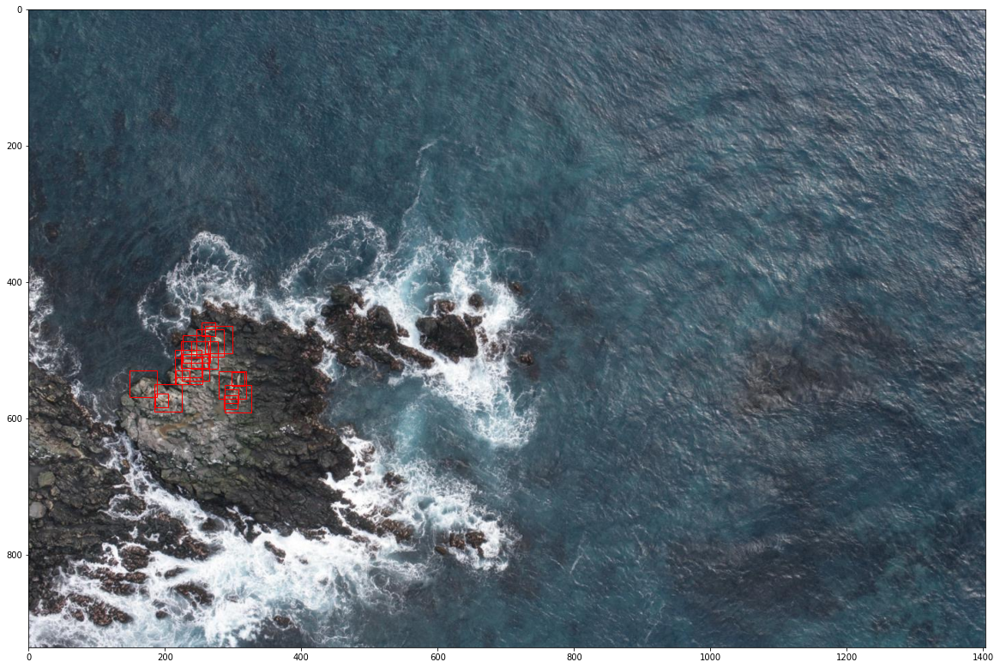

In [82]:
with open("save.pkl","rb") as f:
    img_bb_list,blob_list=pickle.load(f)
j=5
print(files[j])
print(filesdotted[j])
print(files_blobs[j])
fig,ax = plt.subplots(1,figsize=(20,20))
img=plt.imread(files[j])
ax.imshow(img)
for i in range(len(img_bb_list[j])):
    height=img_bb_list[j][i][1]-img_bb_list[j][i][0]
    width=img_bb_list[j][i][3]-img_bb_list[j][i][2]
    rect = patches.Rectangle((img_bb_list[j][i][2],img_bb_list[j][i][0]),width,height,linewidth=1,edgecolor='r',facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)

In [56]:
temp=[]
file_list=sorted(os.listdir(folder))
for i in range(len(blob_list2)):
    img_shape=plt.imread(files[i]).shape
    for j in range(len(img_bb_list[i])):
        temp.append(np.array([file_list[i],blob_list2[i][1][j],img_shape[1],img_shape[0],img_bb_list[i][j][2],img_bb_list[i][j][0], img_bb_list[i][j][3], img_bb_list[i][j][1]]))

file_data=pd.DataFrame(temp,columns=["filename","class","width","height","xmin","ymin","xmax","ymax"])
file_data.to_csv("tensorflow2.csv")
path = 'tensorflow2.csv'
save_json_path = 'annotations.json'


data = pd.read_csv(path)

images = []
categories = []
annotations = []

category = {}
category["supercategory"] = 'None'
category["id"] = 0
category["name"] = 'None'
categories.append(category)

data['fileid'] = data['filename'].astype('category').cat.codes
data['categoryid']= pd.Categorical(data['class'],ordered= True).codes
data['categoryid'] = data['categoryid']+1
data['annid'] = data.index

def image(row):
    image = {}
    image["height"] = row.height
    image["width"] = row.width
    image["id"] = row.fileid
    image["file_name"] = row.filename
    return image

def category(row):
    category = {}
    category["supercategory"] = 'Seal'
    category["id"] = row.categoryid
    category["name"] = row[3]
    return category

def annotation(row):
    annotation = {}
    area = (row.xmax -row.xmin)*(row.ymax - row.ymin)
    annotation["segmentation"] = []
    annotation["iscrowd"] = 0
    annotation["area"] = area
    annotation["image_id"] = row.fileid

    annotation["bbox"] = [row.xmin, row.ymin, row.xmax -row.xmin,row.ymax-row.ymin ]

    annotation["category_id"] = row.categoryid
    annotation["id"] = row.annid
    return annotation

for row in data.itertuples():
    annotations.append(annotation(row))

imagedf = data.drop_duplicates(subset=['fileid']).sort_values(by='fileid')
for row in imagedf.itertuples():
    images.append(image(row))

catdf = data.drop_duplicates(subset=['categoryid']).sort_values(by='categoryid')
for row in catdf.itertuples():
    categories.append(category(row))

data_coco = {}
data_coco["images"] = images
data_coco["categories"] = categories
data_coco["annotations"] = annotations
data_coco["info"] = {}
data_coco["licenses"] = {}


json.dump(data_coco, open(save_json_path, "w"), indent=4)

In [84]:
path = 'tensorflow.csv'
save_json_path = '../Downsampled/Train/annotations.json'


data = pd.read_csv(path)

images = []
categories = []
annotations = []

category = {}
category["supercategory"] = 'None'
category["id"] = 0
category["name"] = 'None'
categories.append(category)

data['fileid'] = data['filename'].astype('category').cat.codes
data['categoryid']= pd.Categorical(data['class'],ordered= True).codes
data['categoryid'] = data['categoryid']+1
data['annid'] = data.index

def image(row):
    image = {}
    image["height"] = row.height
    image["width"] = row.width
    image["id"] = row.fileid
    image["file_name"] = row.filename
    return image

def category(row):
    category = {}
    category["supercategory"] = 'Seal'
    category["id"] = row.categoryid
    category["name"] = row[3]
    return category

def annotation(row):
    annotation = {}
    area = (row.xmax -row.xmin)*(row.ymax - row.ymin)
    annotation["segmentation"] = []
    annotation["iscrowd"] = 0
    annotation["area"] = area
    annotation["image_id"] = row.fileid

    annotation["bbox"] = [row.xmin, row.ymin, row.xmax -row.xmin,row.ymax-row.ymin ]

    annotation["category_id"] = row.categoryid
    annotation["id"] = row.annid
    return annotation

for row in data.itertuples():
    annotations.append(annotation(row))

imagedf = data.drop_duplicates(subset=['fileid']).sort_values(by='fileid')
for row in imagedf.itertuples():
    images.append(image(row))

catdf = data.drop_duplicates(subset=['categoryid']).sort_values(by='categoryid')
for row in catdf.itertuples():
    categories.append(category(row))

data_coco = {}
data_coco["images"] = images
data_coco["categories"] = categories
data_coco["annotations"] = annotations
data_coco["info"] = {}
data_coco["licenses"] = {}


json.dump(data_coco, open(save_json_path, "w"), indent=4)

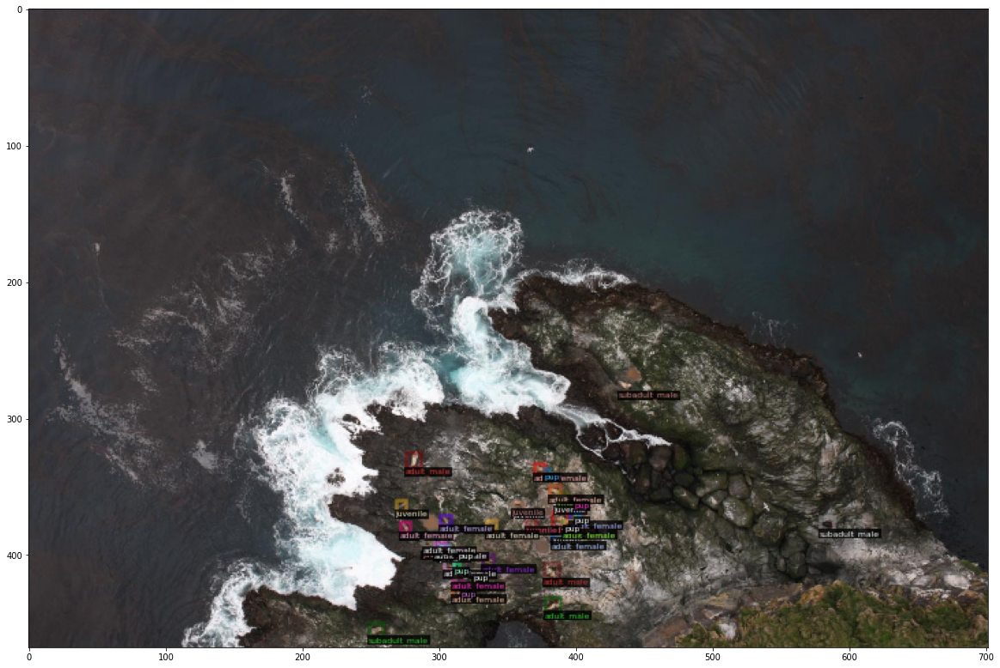

In [11]:
for d in random.sample(dataset_dicts2, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:,:,::-1], metadata=seals_metadata2, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(20,20))
    plt.imshow(vis.get_image())

In [2]:
DatasetCatalog.clear()
MetadataCatalog.clear()
#register_coco_instances("sealstrain", {}, "../NOAA/Train/train.json", "../NOAA/Train")
#seals_metadata = MetadataCatalog.get("sealstrain")
#dataset_dicts = DatasetCatalog.get("sealstrain")
register_coco_instances("sealstest", {}, "../Downsampled/Train/train.json", "../Downsampled/Train")
seals_metadata2 = MetadataCatalog.get("sealstest")
dataset_dicts2 = DatasetCatalog.get("sealstest")
    
files = [os.path.join("../Downsampled/Train/", f) for f in os.listdir("../Downsampled/Train/") if (os.path.isfile(os.path.join("../Downsampled/Train/", f)) and  "csv" not in f and "json" not in f)]
average=[]
for file in files:
    img = io.imread(file)
    average.append(img.mean(axis=0).mean(axis=0))

mean_pixel_values=np.array(average).mean(axis=0)
std_pixel_values=np.array(average).std(axis=0)


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



In [3]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [4]:
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
from detectron2.data.dataset_mapper import DatasetMapper
from detectron2.data import build_detection_test_loader, build_detection_train_loader


transform_list = [
    #    T.RandomBrightness(0.8, 1.8),
    #    T.RandomContrast(0.6, 1.3),
    #    T.RandomSaturation(0.8, 1.4),
    #    T.RandomLighting(0.7),
        T.RandomCrop("absolute", (640, 640))]

class MyTrainer(DefaultTrainer):

    @classmethod
    def build_train_loader(cls, cfg):
        mapper = DatasetMapper(cfg, is_train=True, augmentations=transform_list)
        return build_detection_train_loader(cfg, mapper=mapper)

In [5]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.INPUT.MAX_SIZE_TRAIN = 1500
cfg.INPUT.MIN_SIZE_TRAIN = 1000
cfg.INPUT.MAX_SIZE_TEST = 1500
cfg.INPUT.MIN_SIZE_TEST = 1000
cfg.DATASETS.TRAIN = ("sealstest",)
cfg.MODEL.PIXEL_MEAN = [np.float32(mean_pixel_values[2]), np.float32(mean_pixel_values[1]), np.float32(mean_pixel_values[0])]
cfg.MODEL.PIXEL_STD = [np.float32(std_pixel_values[2]), np.float32(std_pixel_values[1]), np.float32(std_pixel_values[0])]
cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
#cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.DEVICE="cuda"
cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-50.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.01
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8,16,32]]
cfg.MODEL.ANCHOR_GENERATOR.ANGLES = [[0,90]]
cfg.SOLVER.MAX_ITER = (
    100
)  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    16
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7  # 7 classes (none, error, pup, adult male, subadult male, female, juvenile)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/16 15:52:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Some model parameters or buffers are not found in the checkpoint:
backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
The checkpoint state_dict contains keys that are not used by the model:
  fc1000.{bias, weight}
  stem.conv1.bias


[08/16 15:53:04 d2.engine.train_loop]: Starting training from iteration 0


/home/hysterio/.pyenv/versions/3.7.6/envs/vivadata/lib/python3.7/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/16 15:53:26 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7ff2e4b0bf80> to CPU due to CUDA OOM
ERROR [08/16 15:53:26 d2.engine.train_loop]: Exception during training:
Traceback (most recent call last):
  File "/home/hysterio/code/noaa_cicd_pipeline/detectron2_repo/detectron2/engine/train_loop.py", line 149, in train
    self.run_step()
  File "/home/hysterio/code/noaa_cicd_pipeline/detectron2_repo/detectron2/engine/defaults.py", line 494, in run_step
    self._trainer.run_step()
  File "/home/hysterio/code/noaa_cicd_pipeline/detectron2_repo/detectron2/engine/train_loop.py", line 274, in run_step
    loss_dict = self.model(data)
  File "/home/hysterio/.pyenv/versions/3.7.6/envs/vivadata/lib/python3.7/site-packages/torch/nn/modules/module.py", line 1130, in _call_impl
    return forward_call(*input, **kwargs)
  File "/home/hysterio/code/noaa_cicd_pipeline/detectron2_repo/detectron2/modeling/meta_arch/rcnn.py", line 161, in forward
    proposals, proposal_

RuntimeError: [enforce fail at alloc_cpu.cpp:73] . DefaultCPUAllocator: can't allocate memory: you tried to allocate 1027729721088 bytes. Error code 12 (Cannot allocate memory)

In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("sealstest", )
predictor = DefaultPredictor(cfg)

[08/11 16:00:52 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                        | Shapes                                         |
|:------------------------------------------------|:-------------------------------------------------------------------------------------------|:-----------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)            |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)            |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weigh

In [13]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts2, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=seals_metadata2   # remove the colors of unsegmented pixels
          )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=(20,20))
    plt.imshow(v.get_image()[:, :, ::-1])

KeyError: 'instances'

In [43]:
outputs

{'proposals': Instances(num_instances=2000, image_height=3744, image_width=5616, fields=[proposal_boxes: Boxes(tensor([[3082.3735, 2765.4646, 3379.7866, 2960.8755],
         [3070.2620, 2820.0762, 3372.4099, 3025.3552],
         [ 179.0229, 2788.0559,  498.0913, 2977.7805],
         ...,
         [1298.5477, 3626.6062, 1556.1986, 3744.0000],
         [ 793.0342,  673.9268, 1073.1487,  882.7446],
         [ 668.0740, 3203.6055,  954.8510, 3416.7129]], device='cuda:0')), objectness_logits: tensor([ 0.0088, -0.0617, -0.0747,  ..., -0.9612, -0.9612, -0.9613],
        device='cuda:0')])}

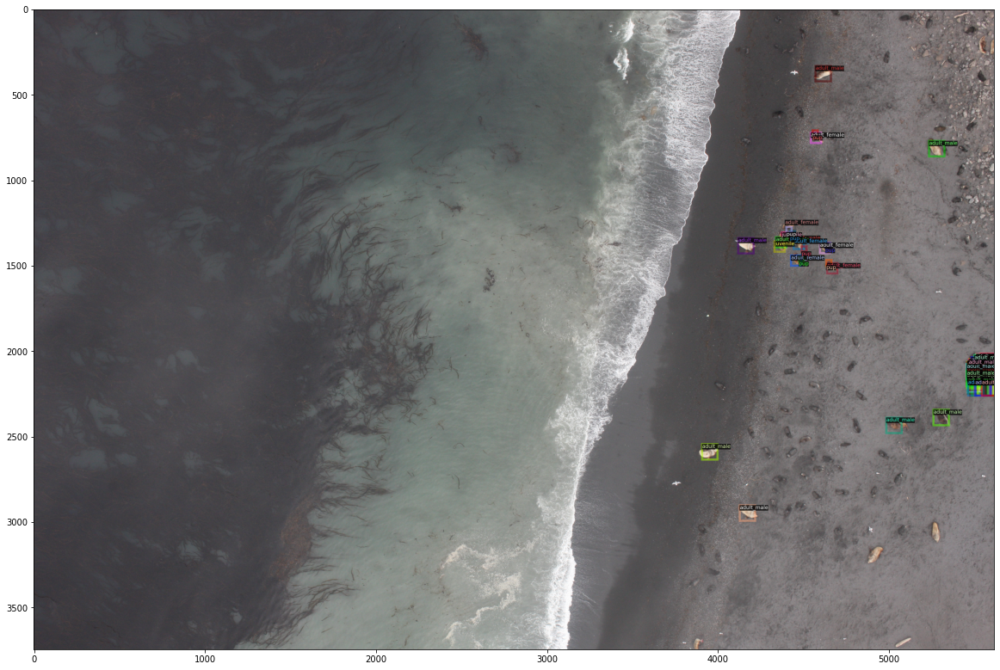

In [10]:
img = cv2.imread(d["file_name"])
visualizer = Visualizer(img[:,:,::-1], metadata=seals_metadata2)
vis = visualizer.draw_dataset_dict(d)
plt.figure(figsize=(20,20))
plt.imshow(vis.get_image())

In [9]:
import os
import json
from tqdm import tqdm
import shutil

def convert_bbox_coco2yolo(img_width, img_height, bbox):
    """
    Convert bounding box from COCO  format to YOLO format

    Parameters
    ----------
    img_width : int
        width of image
    img_height : int
        height of image
    bbox : list[int]
        bounding box annotation in COCO format: 
        [top left x position, top left y position, width, height]

    Returns
    -------
    list[float]
        bounding box annotation in YOLO format: 
        [x_center_rel, y_center_rel, width_rel, height_rel]
    """
    
    # YOLO bounding box format: [x_center, y_center, width, height]
    # (float values relative to width and height of image)
    x_tl, y_tl, w, h = bbox

    dw = 1.0 / img_width
    dh = 1.0 / img_height

    x_center = x_tl + w / 2.0
    y_center = y_tl + h / 2.0

    x = x_center * dw
    y = y_center * dh
    w = w * dw
    h = h * dh

    return [x, y, w, h]


def convert_coco_json_to_yolo_txt(output_path, json_file):

    with open(json_file) as f:
        json_data = json.load(f)

    # write _darknet.labels, which holds names of all classes (one class per line)
    label_file = os.path.join(output_path, "_darknet.labels")
    with open(label_file, "w") as f:
        for category in tqdm(json_data["categories"], desc="Categories"):
            category_name = category["name"]
            f.write(f"{category_name}\n")

    for image in tqdm(json_data["images"], desc="Annotation txt for each iamge"):
        img_id = image["id"]
        img_name = image["file_name"]
        img_width = image["width"]
        img_height = image["height"]

        anno_in_image = [anno for anno in json_data["annotations"] if anno["image_id"] == img_id]
        anno_txt = os.path.join(output_path, img_name.split(".")[0] + ".txt")
        with open(anno_txt, "w") as f:
            for anno in anno_in_image:
                category = anno["category_id"]
                bbox_COCO = anno["bbox"]
                x, y, w, h = convert_bbox_coco2yolo(img_width, img_height, bbox_COCO)
                f.write(f"{category} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    print("Converting COCO Json to YOLO txt finished!")


convert_coco_json_to_yolo_txt("/home/hysterio/code/NOAA/Train/","annotations2.json")

Annotation txt for each iamge: 100%|██████████| 947/947 [05:15<00:00,  3.00it/s]

Converting COCO Json to YOLO txt finished!


In [10]:
import torch
from IPython.display import Image  # for displaying images
import os 
import random
import shutil
from sklearn.model_selection import train_test_split
import xml.etree.ElementTree as ET
from xml.dom import minidom
from tqdm import tqdm
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt

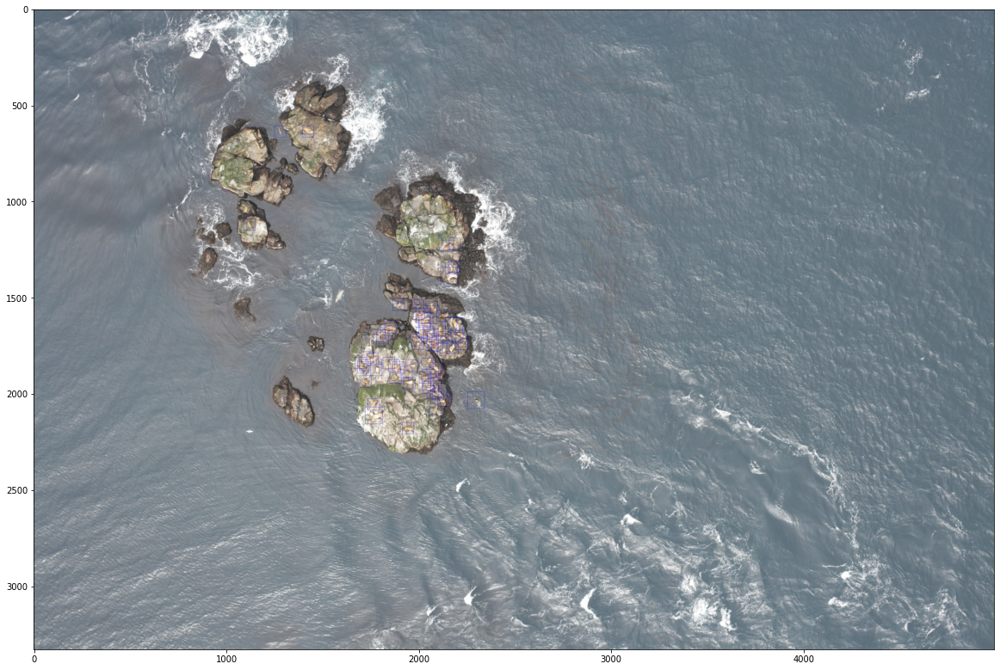

In [11]:
random.seed(2)

annotations = [os.path.join('../NOAA/Train/', x) for x in os.listdir('../NOAA/Train/') if x[-3:] == "txt"]
annotations.sort()

def plot_bounding_box(image, annotation_list):
    annotations = np.array(annotation_list)
    w, h = image.size
    
    plotted_image = ImageDraw.Draw(image)

    transformed_annotations = np.copy(annotations)
    transformed_annotations[:,[1,3]] = annotations[:,[1,3]] * w
    transformed_annotations[:,[2,4]] = annotations[:,[2,4]] * h 
    
    transformed_annotations[:,1] = transformed_annotations[:,1] - (transformed_annotations[:,3] / 2)
    transformed_annotations[:,2] = transformed_annotations[:,2] - (transformed_annotations[:,4] / 2)
    transformed_annotations[:,3] = transformed_annotations[:,1] + transformed_annotations[:,3]
    transformed_annotations[:,4] = transformed_annotations[:,2] + transformed_annotations[:,4]
    
    for ann in transformed_annotations:
        obj_cls, x0, y0, x1, y1 = ann
        plotted_image.rectangle(((x0,y0), (x1,y1)),outline="blue")
        
        #plotted_image.text((x0, y0 - 10), obj_cls)
    plt.figure(figsize=(20,20))
    plt.imshow(np.array(image))
    plt.show()

# Get any random annotation file 
annotation_file = random.choice(annotations)
with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

#Get the corresponding image file
image_file = annotation_file.replace("annotations", "images").replace("txt", "jpg")

#Load the image
image = Image.open(image_file)
#Plot the Bounding Box
plot_bounding_box(image, annotation_list)

In [16]:
images = [os.path.join('../Downsampled/Train/', x) for x in os.listdir('../Downsampled/Train') if x[-3:]=="jpg"]
annotations = [os.path.join('../NOAA/Train/', x) for x in os.listdir('../NOAA/Train/') if x[-3:] == "txt"]

images.sort()
annotations.sort()

# Split the dataset into train-valid-test splits 
train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.1, random_state = 1)
val_images, test_images, val_annotations, test_annotations = train_test_split(val_images, val_annotations, test_size = 0.5, random_state = 1)


In [17]:
!mkdir images/train images/val images/test annotations/train annotations/val annotations/test

In [18]:
def copy_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.copy(f, destination_folder)
        except:
            print(f)
            assert False

# Move the splits into their folders
copy_files_to_folder(train_images, 'images/train')
copy_files_to_folder(val_images, 'images/val/')
copy_files_to_folder(test_images, 'images/test/')
copy_files_to_folder(train_annotations, 'annotations/train/')
copy_files_to_folder(val_annotations, 'annotations/val/')
copy_files_to_folder(test_annotations, 'annotations/test/')

In [6]:
import json

with open('annotations.json', 'r') as f:
    data = json.load(f)

# Output: {'name': 'Bob', 'languages': ['English', 'French']}
print(data)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [39]:
images=[{"height":int(a["height"]/4),"width":int(a["width"]/4),"id":a["id"],"file_name":a["file_name"]} for a in data["images"]]
categories=data["categories"]
annotations=[{"segmentation":[],"iscrowd":0,"area":int(a["bbox"][2]/4*a["bbox"][3]/4),"image_id":a["image_id"],"bbox":[int(a["bbox"][0]/4),int(a["bbox"][1]/4),int(a["bbox"][2]/4),int(a["bbox"][3]/4)],"category_id":a["category_id"],"id":a["id"]} for a in data["annotations"]]

In [41]:
images

[{'height': 936, 'width': 1404, 'id': 0, 'file_name': '0.jpg'},
 {'height': 936, 'width': 1404, 'id': 1, 'file_name': '1.jpg'},
 {'height': 832, 'width': 1248, 'id': 2, 'file_name': '10.jpg'},
 {'height': 832, 'width': 1248, 'id': 3, 'file_name': '100.jpg'},
 {'height': 936, 'width': 1404, 'id': 4, 'file_name': '101.jpg'},
 {'height': 832, 'width': 1248, 'id': 5, 'file_name': '102.jpg'},
 {'height': 832, 'width': 1248, 'id': 6, 'file_name': '103.jpg'},
 {'height': 832, 'width': 1248, 'id': 7, 'file_name': '104.jpg'},
 {'height': 832, 'width': 1248, 'id': 8, 'file_name': '105.jpg'},
 {'height': 936, 'width': 1404, 'id': 9, 'file_name': '106.jpg'},
 {'height': 936, 'width': 1404, 'id': 10, 'file_name': '107.jpg'},
 {'height': 936, 'width': 1404, 'id': 11, 'file_name': '108.jpg'},
 {'height': 832, 'width': 1248, 'id': 12, 'file_name': '109.jpg'},
 {'height': 936, 'width': 1404, 'id': 13, 'file_name': '11.jpg'},
 {'height': 832, 'width': 1248, 'id': 14, 'file_name': '110.jpg'},
 {'height':

In [26]:
new_data={"images":images,"categories":categories,"annotations":annotations,"info":data["info"],"licences":data["licenses"]}

In [27]:
with open('annotations2.json', 'w') as json_file:
    json.dump(new_data, json_file)